In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -U segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 116.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 94.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 40.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 48.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninsta

In [ ]:
!pip install rasterio
!apt-get install -y gdal-bin python3-gdal
!pip install rasterio  # Ensure rasterio is installed (it uses GDAL under the hood)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 85.5 MB/s eta 0:00:00
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  python3-numpy
Suggested packages:
  libgdal-grass python-numpy-doc python3-pytest
The following NEW packages will be installed:
  gdal-bin python3-gdal python3-numpy
0 upgraded, 3 newly installed, 0 to remove and 35 not upgraded.
Need to get 5,168 kB of archives.
After this operation, 25.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 python3-numpy amd64 1:1.21.5-1ubuntu22.04.1 [3,467 kB]
Get:2 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy/main amd64 python3-gdal amd64 3.8.4+dfsg-1~jammy0 [1,095 kB]
Get:3 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy/main amd64 gdal-bin amd64 3.8.4+dfsg-1~jammy0 [605 kB]
Fetched 5,168 kB in 1s (4,156 kB/s)
Selecting previously unselected p

In [ ]:
import rasterio
from rasterio.plot import show
import zipfile
import os
import geopandas as gpd
import matplotlib.pyplot as plt
import ee
import geemap
import numpy as np
import torch

In [ ]:
import os
import shutil
from glob import glob
from sklearn.model_selection import train_test_split

# Point to your NAIP folder and glob all tiles
input_dir = "/content/drive/My Drive/NAIP_Export"
tile_paths = sorted(glob(os.path.join(input_dir, "NAIP_Orange_CA_Tile_*.tif")))

# Split into train (80%) and val (20%)
train_paths, val_paths = train_test_split(
    tile_paths, test_size=0.2, random_state=42
)

# Make subfolders
train_dir = os.path.join(input_dir, "train")
val_dir   = os.path.join(input_dir, "val")
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir,   exist_ok=True)

#Copy files into place
for p in train_paths:
    shutil.copy(p, train_dir)
for p in val_paths:
    shutil.copy(p, val_dir)

print(f"✅ {len(train_paths)} tiles → train/")
print(f"✅ {len(val_paths)} tiles → val/")

✅ 44 tiles → train/
✅ 12 tiles → val/


In [ ]:
# Point to a single tile
tif_path = "/content/drive/My Drive/NAIP_Export/NAIP_Orange_CA_Tile_40.tif"

with rasterio.open(tif_path) as src:
    # Read all 3 bands into a NumPy array of shape (bands, height, width)
    img = src.read()
    print(" dtype:", img.dtype)
    print(" Min value:", img.min())
    print(" Max value:", img.max())
    print(" Shape (bands, H, W):", img.shape)

▶️ dtype: uint8
▶️ Min value: 24
▶️ Max value: 211
▶️ Shape (bands, H, W): (4, 10020, 10020)


In [ ]:
# read the full Orange‐County building layer
fp_path = "/content/drive/Shareddrives/Buildings-v2/CA/CA_Orange.gpkg"
gdf = gpd.read_file(fp_path)

In [ ]:
# open one NAIP tile to get its CRS
with rasterio.open("/content/drive/My Drive/NAIP_Export/train/NAIP_Orange_CA_Tile_55.tif") as src:
    tile_crs = src.crs

# reproject footprints once
if gdf.crs != tile_crs:
    gdf = gdf.to_crs(tile_crs)

In [ ]:
def make_mask_for_tile(tile_path, footprints_gdf, out_shape, transform):
    # get the tile’s geographic bounding box
    with rasterio.open(tile_path) as src:
        minx, miny, maxx, maxy = src.bounds
        transform = src.transform
        height, width = src.height, src.width

    # clip to only geometries that touch this tile
    tile_bb = box(minx, miny, maxx, maxy)
    sub = footprints_gdf[footprints_gdf.intersects(tile_bb)]

    # rasterize that subset into a uint8 0/1 mask
    mask = rasterize(
        [(geom, 1) for geom in sub.geometry],
        out_shape=(height, width),
        transform=transform,
        fill=0,
        dtype="uint8"
    )
    return mask

In [ ]:
from shapely.geometry import box
from rasterio.features import rasterize

# where your tiles live
base = "/content/drive/My Drive/NAIP_Export"
splits = ["train", "val"]

for split in splits:
    img_dir  = os.path.join(base, split)
    msk_dir  = os.path.join(base, split + "_masks")
    os.makedirs(msk_dir, exist_ok=True)

    for tif in glob(os.path.join(img_dir, "NAIP_Orange_CA_Tile_*.tif")):
        # create mask
        mask = make_mask_for_tile(tif, gdf, None, None)

        # save alongside your RGB tile
        out_path = os.path.join(
            msk_dir,
            os.path.basename(tif).replace(".tif", "_mask.tif")
        )
        with rasterio.open(tif) as src:
            meta = src.meta.copy()
        meta.update({"count": 1, "dtype": "uint8"})
        with rasterio.open(out_path, "w", **meta) as dst:
            dst.write(mask, 1)


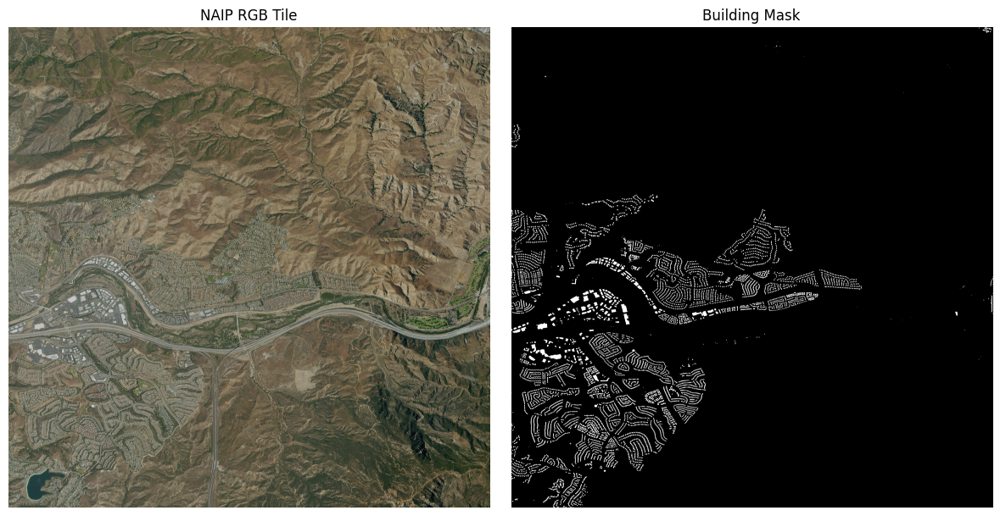

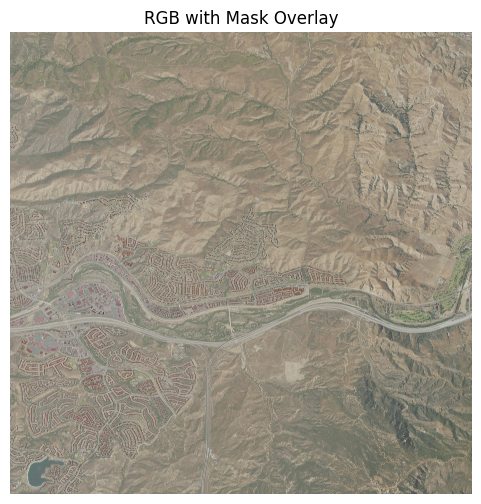

In [ ]:
# paths to one RGB tile and its mask
tile_path = "/content/drive/My Drive/NAIP_Export/train/NAIP_Orange_CA_Tile_44.tif"
mask_path = "/content/drive/My Drive/NAIP_Export/train_masks/NAIP_Orange_CA_Tile_44_mask.tif"

# read RGB bands
with rasterio.open(tile_path) as src:
    rgb = src.read([1,2,3])                      # (3, H, W)
    rgb = np.transpose(rgb, (1,2,0))             # → (H, W, 3)

# read mask
with rasterio.open(mask_path) as src:
    mask = src.read(1)                           # (H, W)

# plot side-by-side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
ax1.imshow(rgb)
ax1.set_title("NAIP RGB Tile")
ax1.axis("off")

ax2.imshow(mask, cmap="gray")
ax2.set_title("Building Mask")
ax2.axis("off")

plt.tight_layout()
plt.show()

# overlay mask on RGB
plt.figure(figsize=(6,6))
plt.imshow(rgb)
plt.imshow(mask, cmap="Reds", alpha=0.3)
plt.title("RGB with Mask Overlay")
plt.axis("off")
plt.show()


--- Plotting 44 masks in 'train_masks' ---



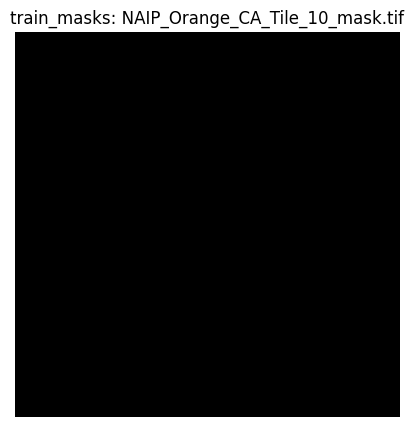

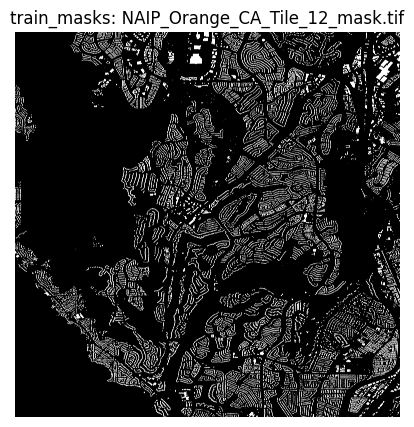

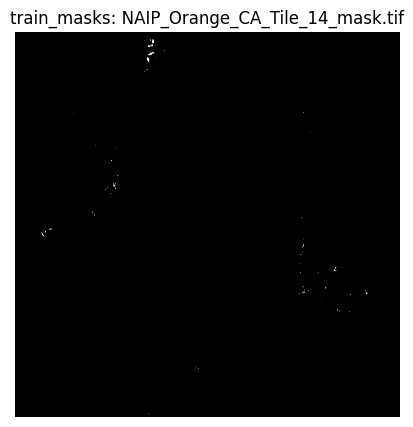

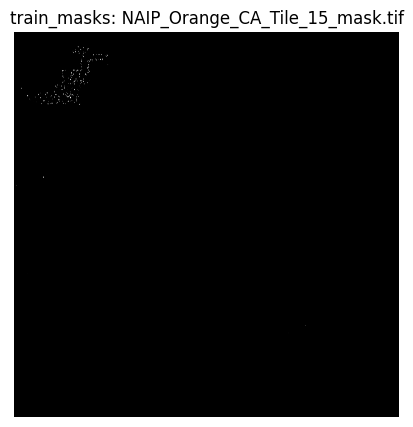

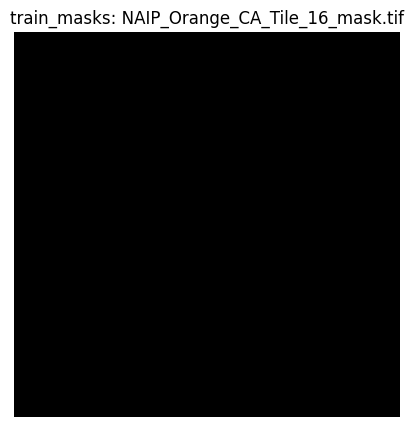

...

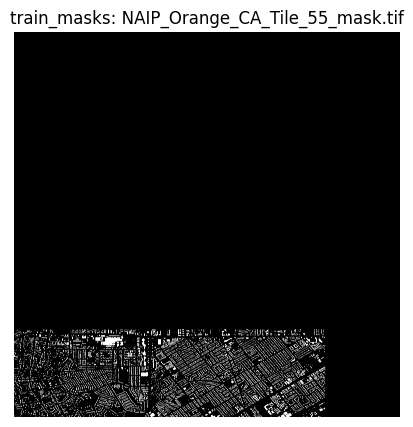

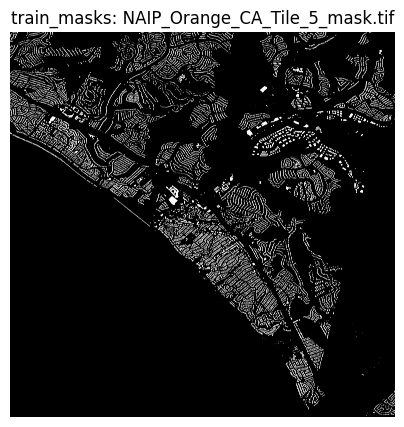

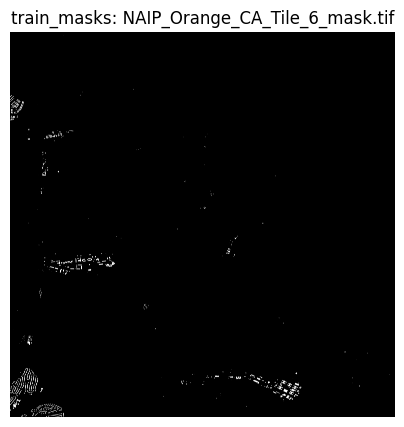

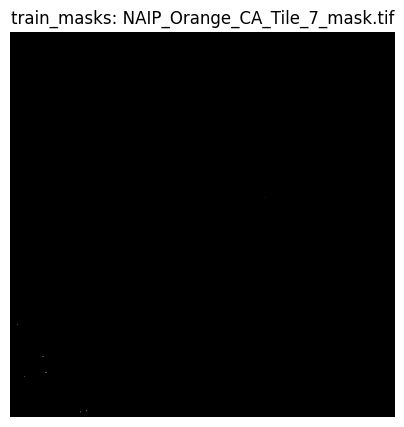

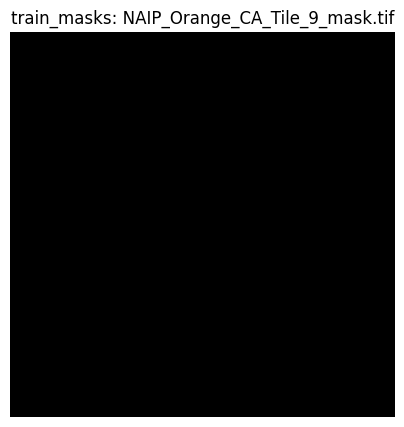


--- Plotting 12 masks in 'val_masks' ---



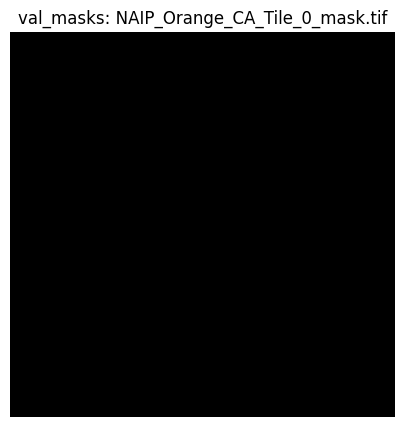

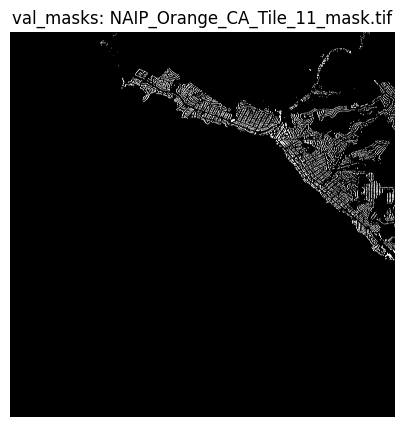

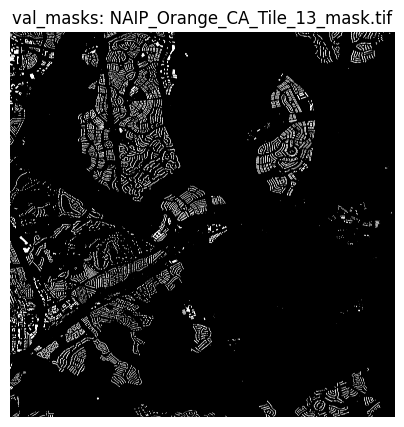

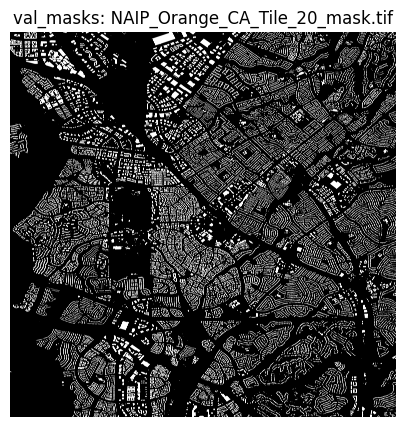

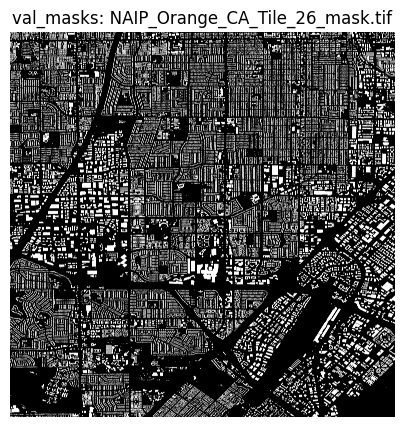

...

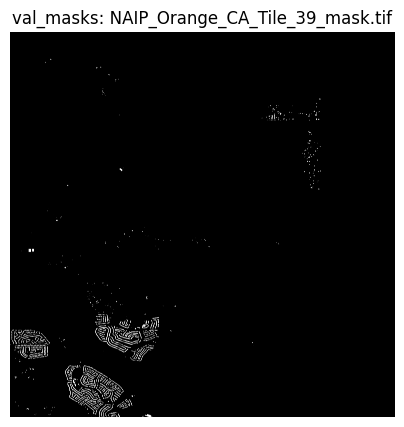

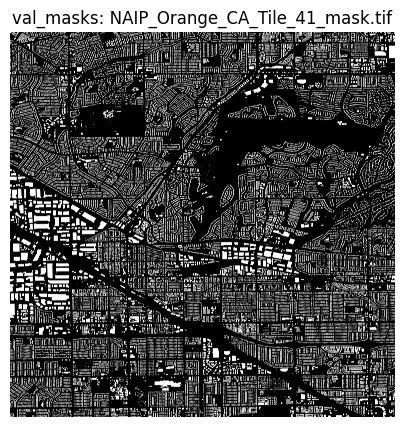

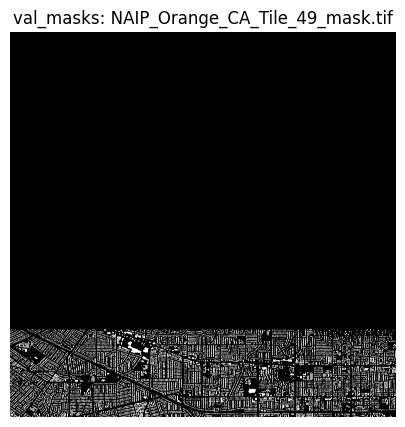

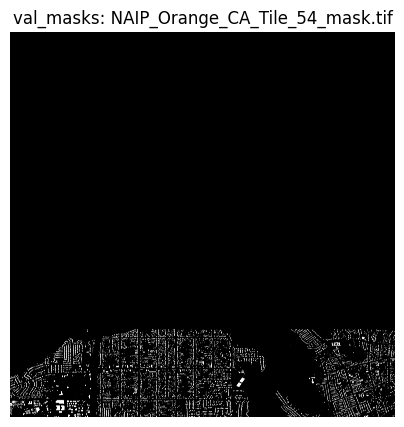

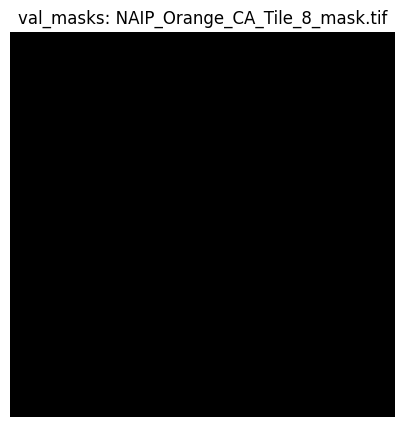

In [ ]:
# Base directory where your train_masks and val_masks folders live
BASE_DIR = "/content/drive/My Drive/NAIP_Export"

for split in ["train_masks", "val_masks"]:
    mask_dir = os.path.join(BASE_DIR, split)
    mask_paths = sorted(glob.glob(os.path.join(mask_dir, "*_mask.tif")))

    print(f"\n--- Plotting {len(mask_paths)} masks in '{split}' ---\n")
    for mpath in mask_paths:
        # Read mask
        with rasterio.open(mpath) as src:
            mask = src.read(1)
        # Plot
        plt.figure(figsize=(5,5))
        plt.imshow(mask, cmap="gray")
        plt.title(f"{split}: {os.path.basename(mpath)}")
        plt.axis("off")
        plt.show()

In [ ]:
from sklearn.model_selection import train_test_split

# Helper: convert 2D mask to one-hot (H, W, 2)
def one_hot_2d(label):
    h, w = label.shape
    oh = np.zeros((h, w, 2), dtype=np.uint8)
    oh[..., 0] = label       # building
    oh[..., 1] = 1 - label   # background
    return oh

# Paths
BASE_DIR       = "/content/drive/My Drive/NAIP_Export"
TRAIN_MASK_DIR = os.path.join(BASE_DIR, "train_masks")
VAL_MASK_DIR   = os.path.join(BASE_DIR, "val_masks")

# Gather mask files
train_masks = sorted(glob.glob(os.path.join(TRAIN_MASK_DIR, "*_mask.tif")))
val_masks   = sorted(glob.glob(os.path.join(VAL_MASK_DIR,   "*_mask.tif")))

print(f"Found {len(train_masks)} train masks, {len(val_masks)} val masks")

# 1) One-hot encode train + val masks
for split, paths in [("train", train_masks), ("val", val_masks)]:
    print(f"\nProcessing {split} masks:")
    for mpath in paths:
        with rasterio.open(mpath) as src:
            mask = src.read(1)
        oh = one_hot_2d(mask)
        print(f" - {os.path.basename(mpath)} → one-hot shape: {oh.shape}")

# 2) Split val into val & test (50/50)
val_train, val_test = train_test_split(val_masks, test_size=0.5, random_state=42)

# Make output directories
VAL_NEW_DIR = os.path.join(BASE_DIR, "val_masks_new", "val")
TEST_DIR    = os.path.join(BASE_DIR, "val_masks_new", "test")
os.makedirs(VAL_NEW_DIR, exist_ok=True)
os.makedirs(TEST_DIR,   exist_ok=True)

# Move files
for p in val_train:
    os.rename(p, os.path.join(VAL_NEW_DIR, os.path.basename(p)))
for p in val_test:
    os.rename(p, os.path.join(TEST_DIR,   os.path.basename(p)))

print(f"\nVal/Test split done:")
print(f" - {len(val_train)} masks → {VAL_NEW_DIR}")
print(f" - {len(val_test)} masks → {TEST_DIR}")

Found 29 train masks, 12 val masks

Processing train masks:
 - NAIP_Orange_CA_Tile_12_mask.tif → one-hot shape: (10020, 10020, 2)
 - NAIP_Orange_CA_Tile_17_mask.tif → one-hot shape: (10019, 10020, 2)
 - NAIP_Orange_CA_Tile_18_mask.tif → one-hot shape: (10019, 10019, 2)
 - NAIP_Orange_CA_Tile_19_mask.tif → one-hot shape: (10019, 10020, 2)
 - NAIP_Orange_CA_Tile_21_mask.tif → one-hot shape: (10019, 10020, 2)
 - NAIP_Orange_CA_Tile_22_mask.tif → one-hot shape: (10019, 10019, 2)
 - NAIP_Orange_CA_Tile_23_mask.tif → one-hot shape: (10019, 10020, 2)
 - NAIP_Orange_CA_Tile_24_mask.tif → one-hot shape: (10020, 10020, 2)
 - NAIP_Orange_CA_Tile_25_mask.tif → one-hot shape: (10020, 10020, 2)
 - NAIP_Orange_CA_Tile_27_mask.tif → one-hot shape: (10020, 10020, 2)
 - NAIP_Orange_CA_Tile_28_mask.tif → one-hot shape: (10020, 10020, 2)
 - NAIP_Orange_CA_Tile_29_mask.tif → one-hot shape: (10020, 10020, 2)
 - NAIP_Orange_CA_Tile_31_mask.tif → one-hot shape: (10020, 10020, 2)
 - NAIP_Orange_CA_Tile_33_mask

In [ ]:
import os
import glob
import rasterio
from rasterio.windows import Window

# ─── CONFIG ────────────────────────────────────────────────────────────────
BASE_DIR       = "/content/drive/My Drive/NAIP_Export"
ORIG_VAL_DIR   = os.path.join(BASE_DIR, "val")               # original val images
VAL_MASK_VAL   = os.path.join(BASE_DIR, "val_masks_new", "val")
VAL_MASK_TEST  = os.path.join(BASE_DIR, "val_masks_new", "test")
PATCH_SIZE     = 512
THRESHOLD      = 0.05  # drop <5% building

# helper to tile one split
def make_patches(image_dir, mask_dir, out_dir):
    img_out = os.path.join(out_dir, "images")
    msk_out = os.path.join(out_dir, "masks")
    os.makedirs(img_out, exist_ok=True)
    os.makedirs(msk_out, exist_ok=True)

    # for each mask in mask_dir
    for mpath in sorted(glob.glob(os.path.join(mask_dir, "*_mask.tif"))):
        base = os.path.basename(mpath).replace("_mask.tif", "")
        ipath = os.path.join(image_dir, base + ".tif")
        if not os.path.exists(ipath):
            print(f"⚠️  Missing image for {base}, skipping")
            continue

        with rasterio.open(ipath)  as src_img, \
             rasterio.open(mpath) as src_msk:

            for y in range(0, src_img.height, PATCH_SIZE):
                for x in range(0, src_img.width, PATCH_SIZE):
                    win = Window(x, y, PATCH_SIZE, PATCH_SIZE)

                    # load mask patch & skip low coverage
                    pm = src_msk.read(1, window=win, boundless=True, fill_value=0)
                    if pm.sum() / pm.size < THRESHOLD:
                        continue

                    # load image patch
                    pi = src_img.read([1,2,3], window=win, boundless=True, fill_value=0)

                    name = f"{base}_{y}_{x}"
                    # write image
                    meta = src_img.meta.copy()
                    meta.update({
                        "height": PATCH_SIZE,
                        "width": PATCH_SIZE,
                        "count": 3,
                        "transform": src_img.window_transform(win),
                    })
                    with rasterio.open(os.path.join(img_out, f"{name}.tif"), "w", **meta) as dst:
                        dst.write(pi)

                    # write mask
                    mmeta = src_msk.meta.copy()
                    mmeta.update({
                        "height": PATCH_SIZE,
                        "width": PATCH_SIZE,
                        "count": 1,
                        "dtype": "uint8",
                        "transform": src_msk.window_transform(win),
                    })
                    with rasterio.open(os.path.join(msk_out, f"{name}_mask.tif"), "w", **mmeta) as dst:
                        dst.write(pm, 1)

    print(f"✅ Done {os.path.basename(out_dir)} → {len(os.listdir(img_out))} images, {len(os.listdir(msk_out))} masks")

# Run for val and test
make_patches(ORIG_VAL_DIR, VAL_MASK_VAL, os.path.join(BASE_DIR, "val_patches"))
make_patches(ORIG_VAL_DIR, VAL_MASK_TEST, os.path.join(BASE_DIR, "test_patches"))


⚠️  Missing image for NAIP_Orange_CA_Tile_8, skipping
✅ Done val_patches → 1121 images, 1121 masks
⚠️  Missing image for NAIP_Orange_CA_Tile_0, skipping
⚠️  Missing image for NAIP_Orange_CA_Tile_2, skipping
✅ Done test_patches → 713 images, 713 masks


In [ ]:
import os
import glob
import rasterio
from rasterio.windows import Window

# ─── CONFIG ────────────────────────────────────────────────────────────────
BASE_DIR           = "/content/drive/My Drive/NAIP_Export"
SPLIT              = "test"               # only the test split
PATCH_SIZE         = 512
COVERAGE_THRESHOLD = 0.05                 # drop patches with <5% buildings

# ─── PATHS ─────────────────────────────────────────────────────────────────
img_dir = os.path.join(BASE_DIR, SPLIT)                 # e.g. ".../test/"
msk_dir = os.path.join(BASE_DIR, f"{SPLIT}_masks")     # e.g. ".../test_masks/"
out_img = os.path.join(BASE_DIR, f"{SPLIT}_patches", "images")
out_msk = os.path.join(BASE_DIR, f"{SPLIT}_patches", "masks")

os.makedirs(out_img, exist_ok=True)
os.makedirs(out_msk, exist_ok=True)

# ─── TILE & FILTER ─────────────────────────────────────────────────────────
for img_path in sorted(glob.glob(os.path.join(img_dir, "*.tif"))):
    base = os.path.splitext(os.path.basename(img_path))[0]
    mask_path = os.path.join(msk_dir, f"{base}_mask.tif")
    if not os.path.exists(mask_path):
        print(f"⚠️  No mask for {base}, skipping.")
        continue

    with rasterio.open(img_path) as src_img, rasterio.open(mask_path) as src_msk:
        for y in range(0, src_img.height, PATCH_SIZE):
            for x in range(0, src_img.width, PATCH_SIZE):
                win = Window(x, y, PATCH_SIZE, PATCH_SIZE)

                # read mask patch & compute building coverage
                patch_m = src_msk.read(1, window=win, boundless=True, fill_value=0)
                if patch_m.sum() / patch_m.size < COVERAGE_THRESHOLD:
                    continue  # drop low‐coverage

                # read image patch
                patch_i = src_img.read([1,2,3], window=win, boundless=True, fill_value=0)

                # write out
                name = f"{base}_{y}_{x}"
                img_out = os.path.join(out_img, f"{name}.tif")
                msk_out = os.path.join(out_msk, f"{name}_mask.tif")

                # image metadata
                meta = src_img.meta.copy()
                meta.update({
                    "height": PATCH_SIZE,
                    "width":  PATCH_SIZE,
                    "count":  3,
                    "transform": src_img.window_transform(win),
                })
                with rasterio.open(img_out, "w", **meta) as dst:
                    dst.write(patch_i)

                # mask metadata
                mmeta = src_msk.meta.copy()
                mmeta.update({
                    "height": PATCH_SIZE,
                    "width":  PATCH_SIZE,
                    "count":  1,
                    "dtype":  "uint8",
                    "transform": src_msk.window_transform(win),
                })
                with rasterio.open(msk_out, "w", **mmeta) as dst:
                    dst.write(patch_m, 1)

print(f"✅ Finished tiling & filtering '{SPLIT}'. Patches are in '{SPLIT}_patches/'.")

Plotting first 5 patches in train_patches


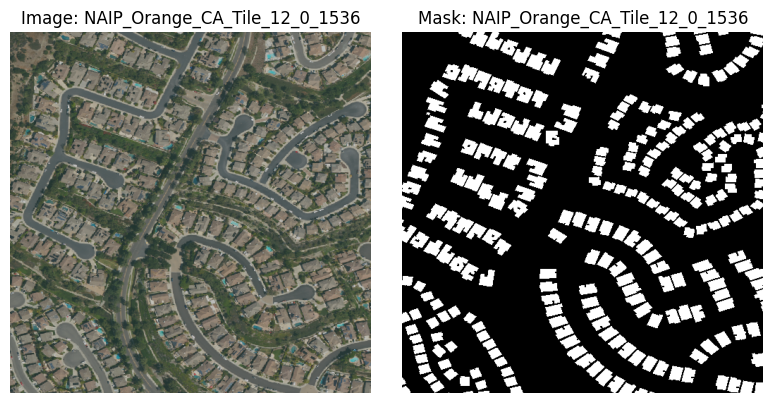

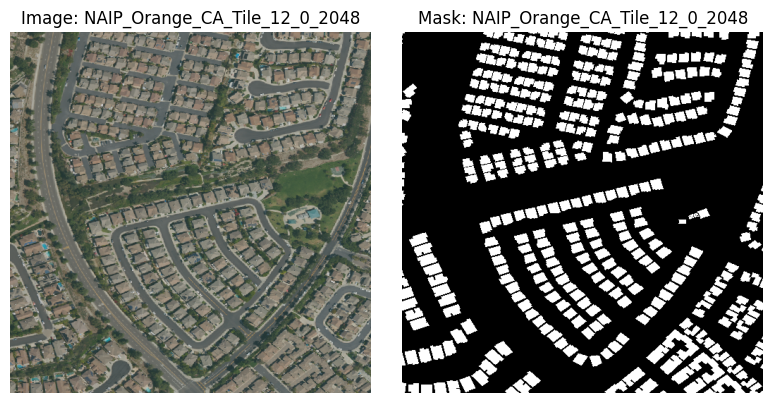

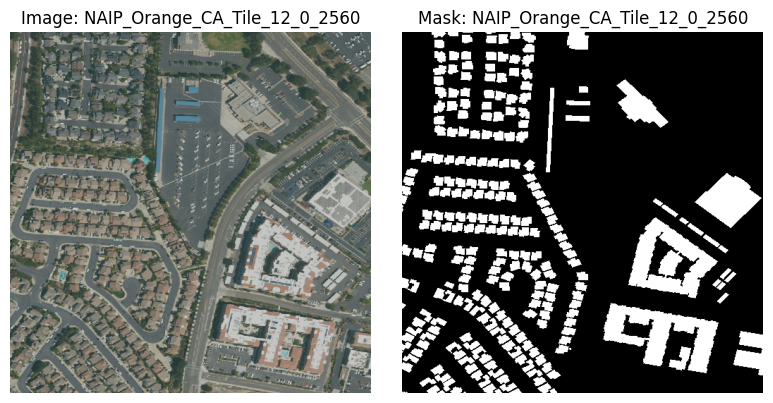

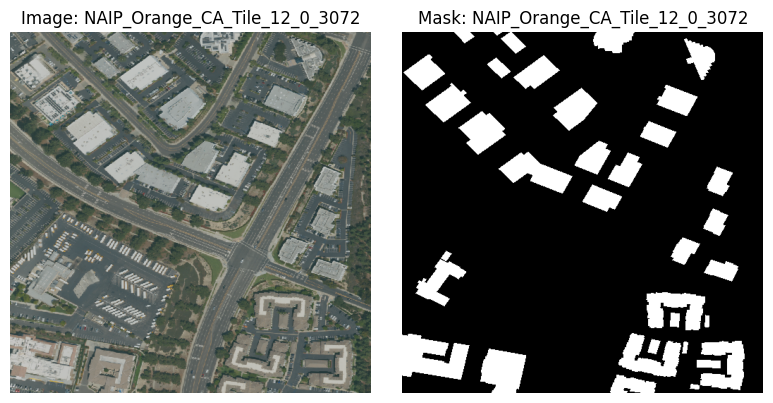

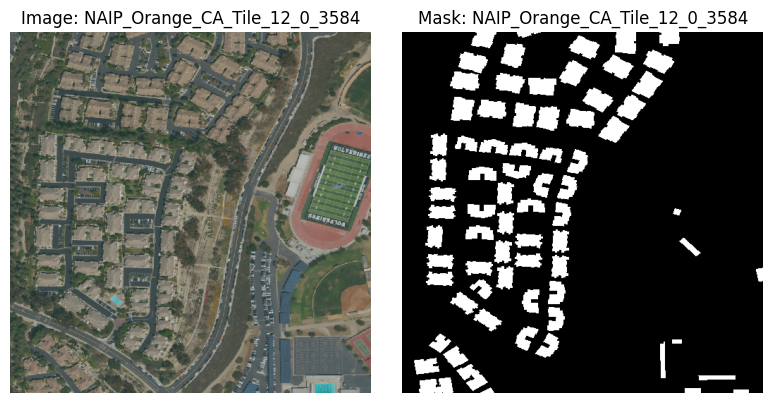

In [ ]:
# base folder where your patched data lives
BASE_DIR = "/content/drive/My Drive/NAIP_Export"

# you can loop over train_patches, val_patches, test_patches as needed
for split in ["train_patches", "val_patches"]:
    img_dir = os.path.join(BASE_DIR, split, "images")
    msk_dir = os.path.join(BASE_DIR, split, "masks")

    img_paths = sorted(glob.glob(os.path.join(img_dir, "*.tif")))
    if not img_paths:
        print(f"No image patches found in {img_dir}")
        continue

    print(f"Plotting first 5 patches in {split}")
    for img_path in img_paths[:5]:
        # derive mask path from image filename
        base = os.path.basename(img_path).replace(".tif", "")
        msk_path = os.path.join(msk_dir, f"{base}_mask.tif")

        # load RGB patch
        with rasterio.open(img_path) as src:
            img = src.read([1,2,3]).transpose(1,2,0)  # → (H, W, 3)
        # load mask patch
        with rasterio.open(msk_path) as src:
            mask = src.read(1)                        # → (H, W)

        # plot side by side
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img)
        plt.title(f"Image: {base}")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask, cmap="gray")
        plt.title(f"Mask: {base}")
        plt.axis("off")
        plt.tight_layout()
        plt.show()
    # remove/comment-out the next line if you want to also plot val_patches
    break

In [ ]:
from torch.utils.data import DataLoader
import segmentation_models_pytorch as smp

In [ ]:
# sanity check
print("smp version:", smp.__version__)
model = smp.Unet(
    encoder_name="resnet50",
    encoder_weights="imagenet",
    classes=1,
    activation="sigmoid",
)

smp version: 0.5.0


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [ ]:
# ─── Install dependencies (run once) ─────────────────────────────────────────
!pip install -q segmentation-models-pytorch albumentations rasterio torch torchvision

import os
import glob
import torch
import rasterio
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.losses import DiceLoss
from segmentation_models_pytorch.utils.metrics import IoU
from segmentation_models_pytorch.utils.train import TrainEpoch, ValidEpoch

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.6' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


<ipython-input-11-aa13fcfea5bf>:7: UserWarning: Argument(s) 'cval, cval_mask' are not valid for transform Affine
  A.Affine(



Epoch 1/10
valid: 100%|██████████| 1121/1121 [03:04<00:00,  6.06it/s, dice_loss - 0.6343, iou_score - 0.6168]
➡️ Saved new best model (IoU=0.6168)

Epoch 2/10
valid: 100%|██████████| 1121/1121 [01:34<00:00, 11.91it/s, dice_loss - 0.6305, iou_score - 0.6421]
➡️ Saved new best model (IoU=0.6421)

Epoch 3/10
valid: 100%|██████████| 1121/1121 [01:39<00:00, 11.28it/s, dice_loss - 0.6288, iou_score - 0.6599]
➡️ Saved new best model (IoU=0.6599)

Epoch 4/10
valid: 100%|██████████| 1121/1121 [01:39<00:00, 11.28it/s, dice_loss - 0.6276, iou_score - 0.677]
➡️ Saved new best model (IoU=0.6770)

Epoch 5/10
valid: 100%|██████████| 1121/1121 [00:55<00:00, 20.03it/s, dice_loss - 0.6274, iou_score - 0.68]
➡️ Saved new best model (IoU=0.6800)

Epoch 6/10
valid: 100%|██████████| 1121/1121 [01:32<00:00, 12.07it/s, dice_loss - 0.6268, iou_score - 0.6853]
➡️ Saved new best model (IoU=0.6853)

Epoch 7/10
valid: 100%|██████████| 1121/1121 [01:35<00:00, 11.74it/s, dice_loss - 0.6265, iou_score - 0.6798]

Epo

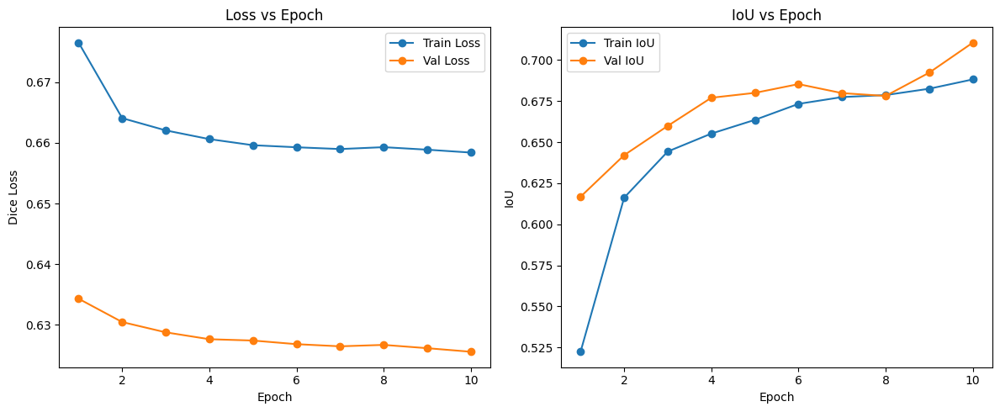

In [ ]:
# ─── 1️⃣ Augmentations & preprocessing ───────────────────────────────────────
def get_training_augmentation():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.Affine(
            scale=(0.9, 1.1),
            rotate=(-15, 15),
            translate_percent=0.1,
            p=0.5,
            cval=0,         # correct fill for image
            cval_mask=0     # correct fill for mask
        ),
    ])

def get_validation_augmentation():
    return A.Compose([])

def get_preprocessing(preprocessing_fn):
    return A.Compose([
        A.Lambda(image=preprocessing_fn),
        ToTensorV2(),
    ])

# ─── 2️⃣ Dataset ─────────────────────────────────────────────────────────────
class BuildingsDataset(Dataset):
    def __init__(self, image_dir, mask_dir, augmentation=None, preprocessing=None):
        self.image_paths  = sorted(glob.glob(os.path.join(image_dir, "*.tif")))
        self.mask_paths   = [
            os.path.join(mask_dir,
                         os.path.basename(p).replace(".tif", "_mask.tif"))
            for p in self.image_paths
        ]
        self.augmentation  = augmentation
        self.preprocessing = preprocessing

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # 1) Load RGB image (3 bands)
        with rasterio.open(self.image_paths[idx]) as src:
            image = src.read([1,2,3]).transpose(1,2,0)  # H, W, 3

        # 2) Load mask (single band 0/1)
        with rasterio.open(self.mask_paths[idx]) as src:
            mask = src.read(1)                          # H, W
        mask = (mask > 0).astype("uint8")

        # 3) Augment
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample["image"], sample["mask"]

        # 4) Preprocess (norm + to tensor)
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample["image"], sample["mask"]
            # image: FloatTensor (3,H,W); mask: LongTensor (H,W)

        # 5) Add channel dim to mask → (1,H,W)
        mask = mask.unsqueeze(0).float()

        return image.float(), mask

# ─── 3️⃣ Paths & hyperparameters ────────────────────────────────────────────
BASE_DIR     = "/content/drive/My Drive/NAIP_Export"
SAVE_PATH = "/content/drive/MyDrive/NAIP_Export/best_model.pth"
x_train_dir  = os.path.join(BASE_DIR, "train_patches/images")
y_train_dir  = os.path.join(BASE_DIR, "train_patches/masks")
x_valid_dir  = os.path.join(BASE_DIR, "val_patches/images")
y_valid_dir  = os.path.join(BASE_DIR, "val_patches/masks")

ENCODER      = "resnet50"
ENC_WEIGHTS  = "imagenet"
ACTIVATION   = "sigmoid"
BATCH_SIZE   = 16
EPOCHS       = 10
LR           = 1e-4
DEVICE       = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ─── 4️⃣ Model & preprocessing_fn ───────────────────────────────────────────
model = smp.Unet(
    encoder_name    = ENCODER,
    encoder_weights = ENC_WEIGHTS,
    classes         = 1,            # one output channel for binary mask
    activation      = ACTIVATION,
)
preproc_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENC_WEIGHTS)
model.to(DEVICE)

# ─── 5️⃣ Datasets & DataLoaders ─────────────────────────────────────────────
train_dataset = BuildingsDataset(
    x_train_dir, y_train_dir,
    augmentation  = get_training_augmentation(),
    preprocessing = get_preprocessing(preproc_fn),
)
valid_dataset = BuildingsDataset(
    x_valid_dir, y_valid_dir,
    augmentation  = get_validation_augmentation(),
    preprocessing = get_preprocessing(preproc_fn),
)

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=4, pin_memory=True
)
valid_loader = DataLoader(
    valid_dataset, batch_size=1, shuffle=False,
    num_workers=2, pin_memory=True
)

# ─── 6️⃣ Loss, metrics, optimizer, scheduler ───────────────────────────────
loss_fn = DiceLoss(mode="binary")
# patch the name so TrainEpoch logs 'dice_loss'
loss_fn.__name__ = "dice_loss"

metrics   = [IoU(threshold=0.5)]
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=1, T_mult=2, eta_min=5e-5
)

train_epoch = TrainEpoch(
    model, loss=loss_fn, metrics=metrics,
    optimizer=optimizer, device=DEVICE, verbose=True
)
valid_epoch = ValidEpoch(
    model, loss=loss_fn, metrics=metrics,
    device=DEVICE, verbose=True
)

# ─── 7️⃣ Training loop & history logging ──────────────────────────────────
train_loss_hist, valid_loss_hist = [], []
train_iou_hist,  valid_iou_hist  = [], []
best_iou = 0.0

for epoch in range(1, EPOCHS+1):
    print(f"\nEpoch {epoch}/{EPOCHS}")
    tr_logs = train_epoch.run(train_loader)
    vl_logs = valid_epoch.run(valid_loader)
    scheduler.step()

    train_loss_hist.append(tr_logs["dice_loss"])
    train_iou_hist.append(tr_logs["iou_score"])
    valid_loss_hist.append(vl_logs["dice_loss"])
    valid_iou_hist.append(vl_logs["iou_score"])

    if vl_logs["iou_score"] > best_iou:
        best_iou = vl_logs["iou_score"]
        torch.save(model.state_dict(), SAVE_PATH)
        print(f"➡️ Saved new best model (IoU={best_iou:.4f})")

# ─── 8️⃣ Plot loss & IoU curves ─────────────────────────────────────────────
epochs = list(range(1, EPOCHS+1))

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(epochs, train_loss_hist, '-o', label='Train Loss')
plt.plot(epochs, valid_loss_hist, '-o', label='Val Loss')
plt.xlabel('Epoch'); plt.ylabel('Dice Loss'); plt.legend(); plt.title('Loss vs Epoch')

plt.subplot(1,2,2)
plt.plot(epochs, train_iou_hist, '-o', label='Train IoU')
plt.plot(epochs, valid_iou_hist, '-o', label='Val IoU')
plt.xlabel('Epoch'); plt.ylabel('IoU'); plt.legend(); plt.title('IoU vs Epoch')

plt.tight_layout()
plt.show()

In [ ]:
# ─── Configuration ─────────────────────────────────────────────────────────────
DEVICE            = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BASE_DIR          = "/content/drive/My Drive/NAIP_Export"
SAVE_PATH = "/content/drive/MyDrive/NAIP_Export/best_model2.pth"
x_train_dir       = os.path.join(BASE_DIR, "train_patches", "images")
y_train_dir       = os.path.join(BASE_DIR, "train_patches", "masks")
x_valid_dir       = os.path.join(BASE_DIR, "val_patches",   "images")
y_valid_dir       = os.path.join(BASE_DIR, "val_patches",   "masks")

ENCODER           = "resnet50"
ENC_WEIGHTS       = "imagenet"
ACTIVATION        = "sigmoid"
BATCH_SIZE        = 16
INITIAL_EPOCHS    = 20   # epochs already completed
ADDITIONAL_EPOCHS = 10   # epochs to continue
TOTAL_EPOCHS      = INITIAL_EPOCHS + ADDITIONAL_EPOCHS
LR                = 1e-4

# ─── 1) Augmentations & Preprocessing ─────────────────────────────────────────
def get_training_augmentation():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.Affine(
            scale=(0.9, 1.1),
            rotate=(-15, 15),
            translate_percent=0.1,
            p=0.5
        ),
    ])

def get_validation_augmentation():
    return A.Compose([])

preproc_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENC_WEIGHTS)
def get_preprocessing(preproc_fn):
    return A.Compose([
        A.Lambda(image=preproc_fn),
        ToTensorV2(),
    ])

# ─── 2) Dataset ────────────────────────────────────────────────────────────────
class BuildingsDataset(Dataset):
    def __init__(self, image_dir, mask_dir, augmentation=None, preprocessing=None):
        self.image_paths   = sorted(glob.glob(os.path.join(image_dir, "*.tif")))
        self.mask_paths    = [
            os.path.join(mask_dir,
                         os.path.basename(p).replace(".tif", "_mask.tif"))
            for p in self.image_paths
        ]
        self.augmentation  = augmentation
        self.preprocessing = preprocessing

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        with rasterio.open(self.image_paths[idx]) as src:
            image = src.read([1,2,3]).transpose(1,2,0)
        with rasterio.open(self.mask_paths[idx]) as src:
            mask = (src.read(1) > 0).astype("uint8")

        if self.augmentation:
            aug = self.augmentation(image=image, mask=mask)
            image, mask = aug["image"], aug["mask"]

        if self.preprocessing:
            proc = self.preprocessing(image=image, mask=mask)
            image, mask = proc["image"], proc["mask"]

        mask = mask.unsqueeze(0).float()
        return image.float(), mask

# ─── 3) DataLoaders ────────────────────────────────────────────────────────────
train_ds = BuildingsDataset(
    x_train_dir, y_train_dir,
    augmentation  = get_training_augmentation(),
    preprocessing = get_preprocessing(preproc_fn),
)
valid_ds = BuildingsDataset(
    x_valid_dir, y_valid_dir,
    augmentation  = get_validation_augmentation(),
    preprocessing = get_preprocessing(preproc_fn),
)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=4, pin_memory=True)
valid_loader = DataLoader(valid_ds, batch_size=1,           shuffle=False, num_workers=2, pin_memory=True)

# ─── 4) Model & Training Utilities ─────────────────────────────────────────────
model = smp.Unet(
    encoder_name    = ENCODER,
    encoder_weights = ENC_WEIGHTS,
    in_channels     = 3,
    classes         = 1,
    activation      = ACTIVATION,
).to(DEVICE)

loss_fn   = DiceLoss(mode="binary")
loss_fn.__name__ = "dice_loss"
metrics   = [IoU(threshold=0.5)]
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=1, T_mult=2, eta_min=5e-5
)

train_epoch = TrainEpoch(
    model, loss=loss_fn, metrics=metrics,
    optimizer=optimizer, device=DEVICE, verbose=True
)
valid_epoch = ValidEpoch(
    model, loss=loss_fn, metrics=metrics,
    device=DEVICE, verbose=True
)

# ─── 5) Load Saved Weights ─────────────────────────────────────────────────────
model.load_state_dict(torch.load("/content/drive/My Drive/NAIP_Export/best_model2.pth", map_location=DEVICE))

# ─── 6) Resume Training ───────────────────────────────────────────────────────
best_iou = 0.0
for epoch in range(INITIAL_EPOCHS+1, TOTAL_EPOCHS+1):
    print(f"\nEpoch {epoch}/{TOTAL_EPOCHS}")
    tr_logs = train_epoch.run(train_loader)
    vl_logs = valid_epoch.run(valid_loader)
    scheduler.step(vl_logs["iou_score"])
    if vl_logs["iou_score"] > best_iou:
        best_iou = vl_logs["iou_score"]
        torch.save(model.state_dict(), SAVE_PATH)
        print(f"➡️ New best model saved (IoU={best_iou:.4f})")


Epoch 21/30
valid: 100%|██████████| 1121/1121 [03:16<00:00,  5.69it/s, dice_loss - 0.6247, iou_score - 0.7137]
➡️ New best model saved (IoU=0.7137)

Epoch 22/30
valid: 100%|██████████| 1121/1121 [01:15<00:00, 14.86it/s, dice_loss - 0.6241, iou_score - 0.7202]
➡️ New best model saved (IoU=0.7202)

Epoch 23/30
valid: 100%|██████████| 1121/1121 [01:51<00:00, 10.06it/s, dice_loss - 0.6237, iou_score - 0.7334]
➡️ New best model saved (IoU=0.7334)

Epoch 24/30
valid: 100%|██████████| 1121/1121 [01:18<00:00, 14.25it/s, dice_loss - 0.6237, iou_score - 0.7313]

Epoch 25/30
valid: 100%|██████████| 1121/1121 [01:42<00:00, 10.96it/s, dice_loss - 0.6234, iou_score - 0.7329]

Epoch 26/30
valid: 100%|██████████| 1121/1121 [01:31<00:00, 12.27it/s, dice_loss - 0.6237, iou_score - 0.7376]
➡️ New best model saved (IoU=0.7376)

Epoch 27/30
valid: 100%|██████████| 1121/1121 [01:33<00:00, 11.95it/s, dice_loss - 0.6234, iou_score - 0.7318]

Epoch 28/30
valid: 100%|██████████| 1121/1121 [01:31<00:00, 12.19it

In [ ]:
import numpy as np

# 1) Define all classes (in lowercase) in the exact order your mask .tif uses
class_names      = ['background', 'building']

# 2) Define the RGB triplets that encode each class in your mask images
#    (for NAIP‐OSM you burned buildings as “1” and background as “0”,
#     so we’ll map 0→black, 1→white)
class_rgb_values = [
    [  0,   0,   0],  # background
    [255, 255, 255],  # building
]

# 3) (Optional) If you only care about a subset, e.g. both in this case:
select_classes       = ['background', 'building']
select_class_indices = [class_names.index(c) for c in select_classes]
select_class_rgb_values = np.array(class_rgb_values)[select_class_indices]

print("class_names:          ", class_names)
print("class_rgb_values:     ", class_rgb_values)
print("select_class_indices: ", select_class_indices)
print("select_class_rgb_values:\n", select_class_rgb_values)

class_names:           ['background', 'building']
class_rgb_values:      [[0, 0, 0], [255, 255, 255]]
select_class_indices:  [0, 1]
select_class_rgb_values:
 [[  0   0   0]
 [255 255 255]]


In [ ]:
import os
import glob
import torch
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
import segmentation_models_pytorch as smp
from albumentations import Compose, Lambda
from albumentations.pytorch import ToTensorV2

# ─── Configuration ─────────────────────────────────────────────────────────────
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BASE_DIR    = "/content/drive/My Drive/NAIP_Export"
x_test_dir  = os.path.join(BASE_DIR, "test_patches", "images")
y_test_dir  = os.path.join(BASE_DIR, "test_patches", "masks")
CHECKPOINT  = "/content/drive/My Drive/NAIP_Export/best_model2.pth"
NUM_SAMPLES = 5

# ─── Augmentation & Preprocessing ──────────────────────────────────────────────
def get_validation_augmentation():
    return Compose([])

# apply the torchvision-style preprocessing_fn inside Albumentations
def get_preprocessing(preprocessing_fn):
    return Compose([
        Lambda(image=preprocessing_fn),  # this calls the SMPTP normalization
        ToTensorV2(),                    # then convert to torch.Tensor
    ])

# get the preprocessing function for your encoder
preproc_fn = smp.encoders.get_preprocessing_fn("resnet50", "imagenet")

# ─── Dataset ───────────────────────────────────────────────────────────────────
class BuildingsDataset(Dataset):
    def __init__(self, image_dir, mask_dir, augmentation=None, preprocessing=None):
        self.image_paths  = sorted(glob.glob(os.path.join(image_dir, "*.tif")))
        self.mask_paths   = [
            os.path.join(mask_dir,
                         os.path.basename(p).replace(".tif", "_mask.tif"))
            for p in self.image_paths
        ]
        self.augmentation  = augmentation
        self.preprocessing = preprocessing

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        with rasterio.open(self.image_paths[idx]) as src:
            image = src.read([1,2,3]).transpose(1,2,0)
        with rasterio.open(self.mask_paths[idx]) as src:
            mask = (src.read(1) > 0).astype("uint8")

        if self.augmentation:
            aug = self.augmentation(image=image, mask=mask)
            image, mask = aug["image"], aug["mask"]

        if self.preprocessing:
            proc = self.preprocessing(image=image, mask=mask)
            image, mask = proc["image"], proc["mask"]

        mask = mask.unsqueeze(0).float()
        return image.float(), mask

# ─── Model Setup ────────────────────────────────────────────────────────────────
model = smp.Unet(
    encoder_name="resnet50",
    encoder_weights=None,
    in_channels=3,
    classes=1,
).to(DEVICE)

# ─── Data Loader ───────────────────────────────────────────────────────────────
test_dataset = BuildingsDataset(
    x_test_dir, y_test_dir,
    augmentation  = get_validation_augmentation(),
    preprocessing = get_preprocessing(preproc_fn),
)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# ─── Load Checkpoint ───────────────────────────────────────────────────────────
checkpoint = torch.load(CHECKPOINT, map_location=DEVICE)
model.load_state_dict(checkpoint)
model.eval()



/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
      

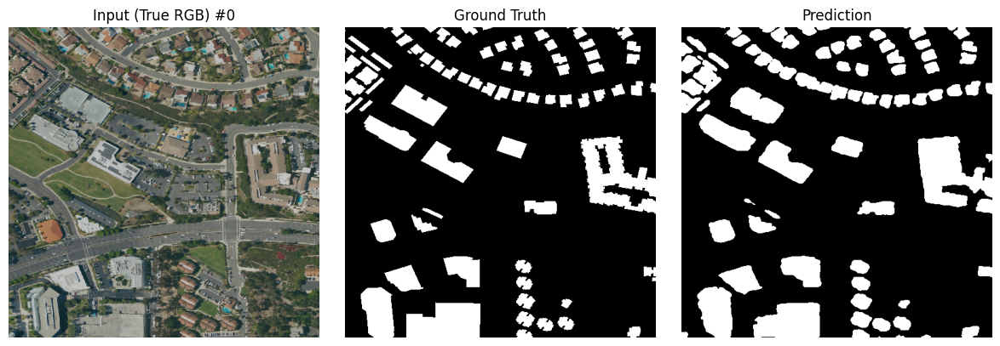

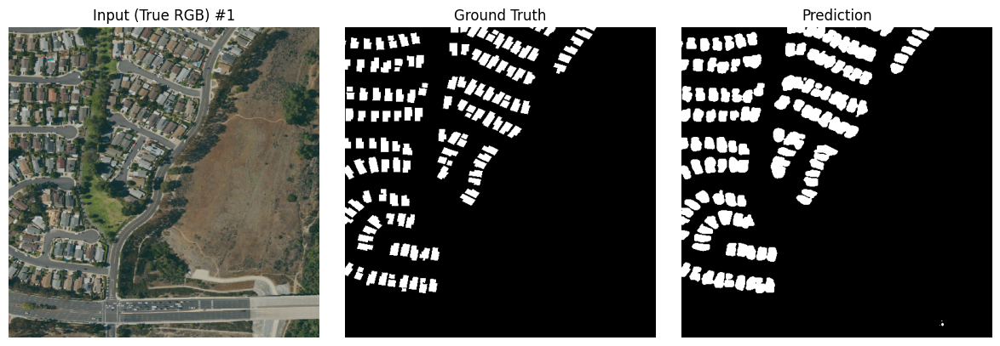

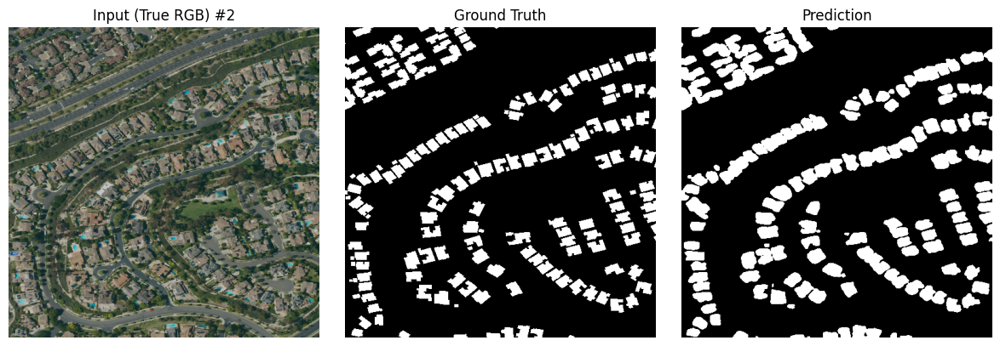

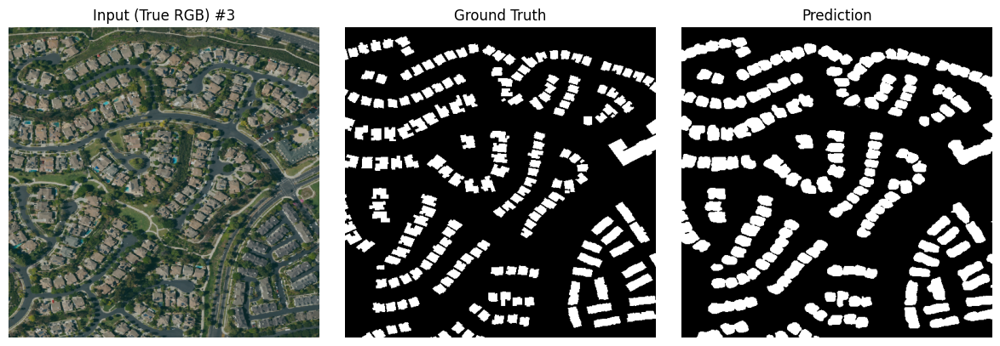

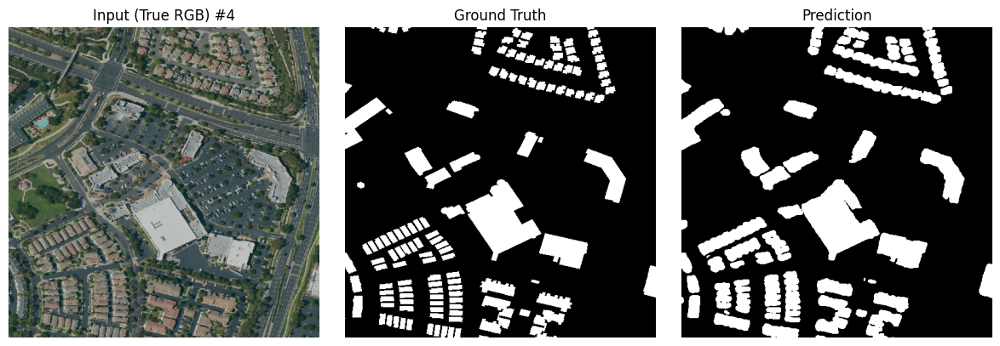

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ─── Constants ─────────────────────────────────────────────────────────────────
NUM_SAMPLES = 5

# ImageNet normalization stats for unnormalizing
MEAN = np.array([0.485, 0.456, 0.406])
STD  = np.array([0.229, 0.224, 0.225])

# ─── Inference & Plotting with True RGB ────────────────────────────────────────
for idx, (img, gt_mask) in enumerate(test_loader):
    if idx >= NUM_SAMPLES:
        break

    img = img.to(DEVICE)
    with torch.no_grad():
        pred = model(img)

    pred_mask = (torch.sigmoid(pred) > 0.5).cpu().squeeze().numpy().astype(np.uint8)
    gt_np      = gt_mask.cpu().squeeze().numpy()

    img_cpu = img.cpu().squeeze().permute(1, 2, 0).numpy()
    unnorm  = (img_cpu * STD + MEAN) * 255.0
    unnorm  = np.clip(unnorm, 0, 255).astype(np.uint8)

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(unnorm)
    axes[0].set_title(f"Input (True RGB) #{idx}")
    axes[0].axis("off")

    axes[1].imshow(gt_np, cmap="gray")
    axes[1].set_title("Ground Truth")
    axes[1].axis("off")

    axes[2].imshow(pred_mask, cmap="gray")
    axes[2].set_title("Prediction")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

Batch mask sums: 773745.0


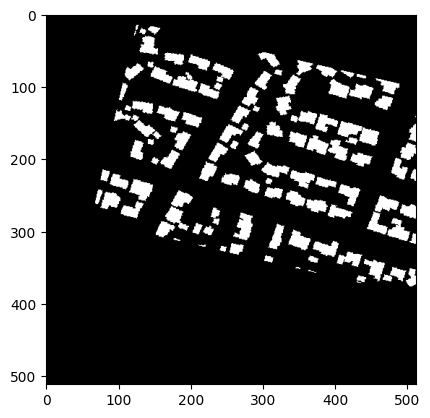

In [ ]:
imgs, masks = next(iter(train_loader))
print("Batch mask sums:", masks.view(-1).sum().item())
plt.imshow(masks[0,0].cpu(), cmap="gray"); plt.show()

In [ ]:
# 0️⃣ Force CPU at the very top, before any geoai or torch.load is invoked
import os, torch

# Hide GPUs so torch.cuda.device_count() == 0
os.environ["CUDA_VISIBLE_DEVICES"] = ""

# Monkey‐patch torch.load to always map to CPU
_original_torch_load = torch.load
def _torch_load_cpu(f, *args, **kwargs):
    return _original_torch_load(f, map_location="cpu")
torch.load = _torch_load_cpu

# 1️⃣ Now import geoai and run the extractor
!pip install -q geoai-py rasterio matplotlib

import geoai
import rasterio
import matplotlib.pyplot as plt

Processing masks with parameters:
- Confidence threshold: 0.01
- Chip size: (512, 512)
- Mask threshold: 0.01
Dataset initialized with 1 rows and 1 columns of chips
Image dimensions: 512 x 512 pixels
Chip size: 512 x 512 pixels
Overlap: 25.0% (stride_x=384, stride_y=384)
CRS: EPSG:4326
Processing raster with 1 batches


100%|██████████| 1/1 [00:00<00:00,  7.16it/s]

Object masks saved to patch_mask.tif


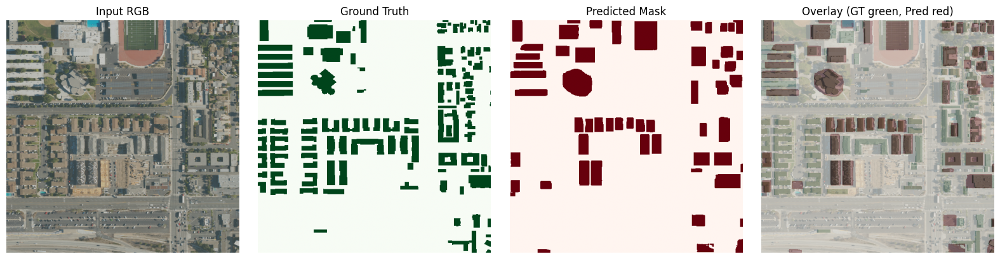

In [ ]:


# 1️⃣ Pick one of your existing image patches (no "_mask" suffix)
patch_path = "/content/drive/My Drive/NAIP_Export/test_patches/images/NAIP_Orange_CA_Tile_41_7168_5120.tif"

# 2️⃣ Run the extractor exactly as before
mask_path = extractor.save_masks_as_geotiff(
    raster_path          = patch_path,
    output_path          = "patch_mask.tif",
    confidence_threshold = 0.01,
    mask_threshold       = 0.01,
)


# 1️⃣ Point to your patch and GeoAI output
pred_mask_path = "patch_mask.tif"  # from extractor.save_masks_as_geotiff

# 2️⃣ Derive your GT mask path
base = os.path.splitext(os.path.basename(patch_path))[0]
gt_mask_path = os.path.join(
    "/content/drive/My Drive/NAIP_Export/test_patches/masks",
    f"{base}_mask.tif"
)

# 3️⃣ Load everything
with rasterio.open(patch_path) as src:
    img = src.read([1,2,3]).transpose(1,2,0).astype(np.uint8)

with rasterio.open(gt_mask_path) as src:
    gt = src.read(1)  # 0/1 ground-truth

with rasterio.open(pred_mask_path) as src:
    pred = src.read(1)  # 0/1 predicted

# 4️⃣ Plot side-by-side + overlay
fig, axes = plt.subplots(1, 4, figsize=(16,4))

axes[0].imshow(img)
axes[0].set_title("Input RGB")
axes[0].axis("off")

axes[1].imshow(gt, cmap="Greens")
axes[1].set_title("Ground Truth")
axes[1].axis("off")

axes[2].imshow(pred, cmap="Reds")
axes[2].set_title("Predicted Mask")
axes[2].axis("off")

# Overlay both masks: green for GT, red for Pred
axes[3].imshow(img)
axes[3].imshow(gt,   cmap="Greens", alpha=0.3)
axes[3].imshow(pred, cmap="Reds",   alpha=0.3)
axes[3].set_title("Overlay (GT green, Pred red)")
axes[3].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import os
import glob
import torch
import rasterio
import numpy as np
from torch.utils.data import Dataset, DataLoader
import segmentation_models_pytorch as smp
from albumentations import Compose, Lambda
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm

# ─── Configuration ─────────────────────────────────────────────────────────────
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BASE_DIR = "/content/drive/MyDrive/NAIP_Export"
image_dir = os.path.join(BASE_DIR, "train_patches", "images")
sam_dir = os.path.join(BASE_DIR, "sam_predict")
output_dir = os.path.join(BASE_DIR, "unet_predict")
os.makedirs(output_dir, exist_ok=True)
CHECKPOINT = os.path.join(BASE_DIR, "best_model2.pth")

# ─── Match tile IDs from SAM predictions ──────────────────────────────────────
sam_files = glob.glob(os.path.join(sam_dir, "*_sam_mask*.tif"))
tile_ids = sorted(set([
    os.path.basename(f).split("_sam_mask")[0]
    for f in sam_files
]))

# ─── Preprocessing ─────────────────────────────────────────────────────────────
def get_preprocessing(preprocessing_fn):
    return Compose([
        Lambda(image=preprocessing_fn),
        ToTensorV2(),
    ])

preproc_fn = smp.encoders.get_preprocessing_fn("resnet50", "imagenet")

# ─── Dataset ───────────────────────────────────────────────────────────────────
class SimpleDataset(Dataset):
    def __init__(self, image_paths, preprocessing=None):
        self.image_paths = image_paths
        self.preprocessing = preprocessing

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        path = self.image_paths[idx]
        with rasterio.open(path) as src:
            img = src.read([1, 2, 3]).transpose(1, 2, 0)

        if self.preprocessing:
            processed = self.preprocessing(image=img)
            img = processed["image"]

        return img.float(), path

# ─── Model ─────────────────────────────────────────────────────────────────────
model = smp.Unet(
    encoder_name="resnet50",
    encoder_weights=None,
    in_channels=3,
    classes=1,
).to(DEVICE)

model.load_state_dict(torch.load(CHECKPOINT, map_location=DEVICE))
model.eval()

# ─── Inference ─────────────────────────────────────────────────────────────────
image_paths = [os.path.join(image_dir, f"{tile_id}.tif") for tile_id in tile_ids]
dataset = SimpleDataset(image_paths, preprocessing=get_preprocessing(preproc_fn))
loader = DataLoader(dataset, batch_size=1, shuffle=False)

for img, path in tqdm(loader, desc="Generating U-Net predictions"):
    img = img.to(DEVICE)
    with torch.no_grad():
        pred = model(img)

    mask = (torch.sigmoid(pred) > 0.5).cpu().squeeze().numpy().astype(np.uint8)

    tile_id = os.path.splitext(os.path.basename(path[0]))[0]
    out_path = os.path.join(output_dir, f"{tile_id}_unet_mask.tif")

    with rasterio.open(path[0]) as src:
        meta = src.meta.copy()
        meta.update({
            "count": 1,
            "dtype": "uint8"
        })

        with rasterio.open(out_path, "w", **meta) as dst:
            dst.write(mask, 1)

Generating U-Net predictions: 100%|██████████| 39/39 [00:47<00:00,  1.22s/it]
